<a href="https://colab.research.google.com/github/MatiasSingermann/IBODS-AI/blob/main/IA_MODEL_MAKER.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Grafica

In [ ]:
import tensorflow as tf
print("Tensorflow version " + tf.__version__)

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
except ValueError:
  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
tpu_strategy = tf.distribute.TPUStrategy(tpu)

Tensorflow version 2.8.2
Running on TPU  ['10.99.152.74:8470']


# Importacion de librerias

In [1]:
!pip install ipyplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 5.2 MB/s 


In [2]:
!pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 5.4 MB/s 
     |████████████████████████████████| 178 kB 40.8 MB/s 
     |████████████████████████████████| 1.1 MB 48.7 MB/s 
     |████████████████████████████████| 67 kB 6.5 MB/s 
     |████████████████████████████████| 54 kB 3.3 MB/s 
     |████████████████████████████████| 138 kB 64.4 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.15-py3-none-any.whl size=24936 sha256=3cbb6ab0f4185eb9c43e561df3a60a086e1938cd6da4b559dc29c19d9cc2ef8a
  Stored in directory: /root/.cache/pip/wheels/13/e0/a3/fe183fffc3972cb9264e800763d4bbfff80d5309137c410217
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=ec13e039433e63e4b499f7c19f0415db1e6d7211b82959a59a69b8aa3d30198f
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e

In [3]:
!pip install tflite-model-maker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 577 kB 5.0 MB/s 
     |████████████████████████████████| 77 kB 5.5 MB/s 
     |████████████████████████████████| 128 kB 62.1 MB/s 
     |████████████████████████████████| 840 kB 50.5 MB/s 
     |████████████████████████████████| 3.4 MB 42.7 MB/s 
     |████████████████████████████████| 60.2 MB 1.6 MB/s 
     |████████████████████████████████| 1.1 MB 62.0 MB/s 
     |████████████████████████████████| 87 kB 7.2 MB/s 
     |████████████████████████████████| 10.9 MB 41.6 MB/s 
     |████████████████████████████████| 1.3 MB 59.0 MB/s 
     |████████████████████████████████| 127 kB 34.9 MB/s 
     |████████████████████████████████| 238 kB 51.9 MB/s 
     |████████████████████████████████| 25.3 MB 11.7 MB/s 
     |████████████████████████████████| 99 kB 10.5 MB/s 
     |████████████████████████████████| 352 kB 52.8 MB/s 
     |█████████████████████████████

Importo `Tensorflow` y varios de sus **modulos**.

In [12]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Input
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tflite_model_maker import object_detector
import tensorflow_hub as hub
from tflite_model_maker.config import QuantizationConfig
from tflite_support.task import vision

Importo varias `librerias` que me permiten trabajar con **tensores**, y **operaciones matematicas** necesrias. 


In [5]:
import pandas as pd
import numpy as np
import torch
import torchvision.transforms as transforms

Importo `librerias` para **administrar archivos** y seleccionar de manera **random** alguno de ellos

In [6]:
import os
import random

Importo `librerias` que me permiten trabajar con las **imagenes** del dataset.

In [7]:
from PIL import Image
import cv2
import ipyplot
import matplotlib.pyplot as plt
from matplotlib.image import imread
from itertools import product
from skimage import draw, transform


        WARNING! Google Colab Environment detected!
        You might encounter issues while running in Google Colab environment.
        If images are not displaying properly please try setting `force_b64` param to `True`.
        


In [8]:
from roboflow import Roboflow

Me conecto a mi cuenta de **Google Drive**.

In [9]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Cargo el DataSet

In [10]:
!unzip gdrive/My\ Drive/Proyecto\ 4to/I.A/Datasets/IBODS_LBL.zip

Se han truncado las últimas 5000 líneas del flujo de salida.
 extracting: train/20210308_12_54_22_000_1EzdZre8PFRv7MqBS6ePYcln0WH3_F_3264_2448-jpg_jpg.rf.bcd69438e8e0ed04aef9e4b87278b8a8.txt  
 extracting: train/20210308_12_54_22_000_1EzdZre8PFRv7MqBS6ePYcln0WH3_F_3264_2448-jpg_jpg.rf.e3bcb961b1d0c7deb1bc9f68e1532b01.jpg  
 extracting: train/20210308_12_54_22_000_1EzdZre8PFRv7MqBS6ePYcln0WH3_F_3264_2448-jpg_jpg.rf.e3bcb961b1d0c7deb1bc9f68e1532b01.txt  
 extracting: train/20210308_13_37_19_000_2sZduHDLGRQCjfgkICzotfm6tip2_F_3120_4160-jpg_jpg.rf.2b5f24d8372826ca209d7e632d609e83.jpg  
 extracting: train/20210308_13_37_19_000_2sZduHDLGRQCjfgkICzotfm6tip2_F_3120_4160-jpg_jpg.rf.2b5f24d8372826ca209d7e632d609e83.txt  
 extracting: train/20210308_13_37_19_000_2sZduHDLGRQCjfgkICzotfm6tip2_F_3120_4160-jpg_jpg.rf.df8ad762ba9b2c0cd2a319b6d468badd.jpg  
 extracting: train/20210308_13_37_19_000_2sZduHDLGRQCjfgkICzotfm6tip2_F_3120_4160-jpg_jpg.rf.df8ad762ba9b2c0cd2a319b6d468badd.txt  
 extracting: tr

In [ ]:
rf = Roboflow(api_key="41l2d60Eq7cWhUOVgPxd")
project = rf.workspace("ibods").project("ibods_lbl")
dataset = project.version(1).download("tensorflow")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to IBODS_LBL-1 in tensorflow:: 100%|██████████| 3521/3521 [00:01<00:00, 1796.95it/s]


In [11]:
rf = Roboflow(api_key="41l2d60Eq7cWhUOVgPxd")
project = rf.workspace("ibods").project("ibods_lbl")
dataset = project.version(1).download("voc")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to IBODS_LBL-1 in voc:: 100%|██████████| 7031/7031 [00:02<00:00, 3354.02it/s]


In [ ]:
dataset.location

'/content/IBODS_LBL-1'

## Mostrando imagenes del dataset

Muestro la primera imagen

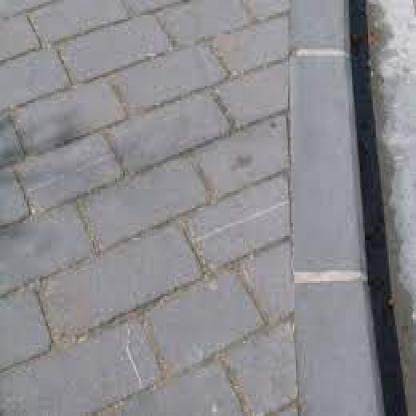

In [ ]:
first_img = tf.keras.preprocessing.image.load_img('train/----------_jpg.rf.4601db75498aceb73120eec23e2b6d06.jpg')
first_img

Agarro una *imagen random* de la carpeta de **train**. Para lograr esto, con un `for`  voy recorriendo todas los archivos de la carpeta **train**. Con un `if`, selecciono de todos esos archivos solo aquellos que terminan con *.jpg*. Luego, creo el *path (o ruta)* de archivos random. Finalmente, con una funcion muestro la *imagen*. 

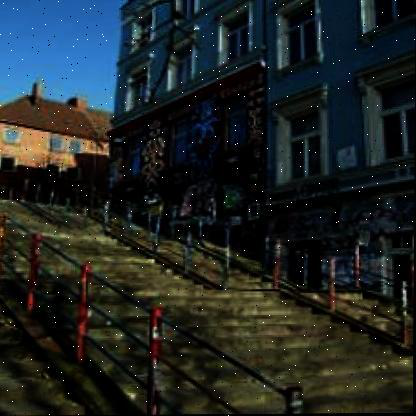

In [ ]:
train_images = [image for image in os.listdir('train') if image.endswith('.jpg')]
img_path = "train/" + random.choice(train_images);
random_img = tf.keras.preprocessing.image.load_img(img_path)
random_img

Utilizando un metodo muy parecido que antes, selecciono 5 imagenes random de la **carpeta train**. 

The input object of type 'JpegImageFile' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'JpegImageFile', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.



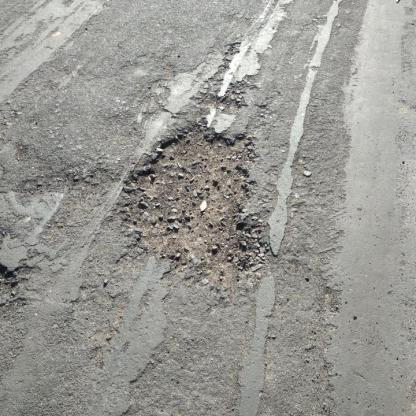
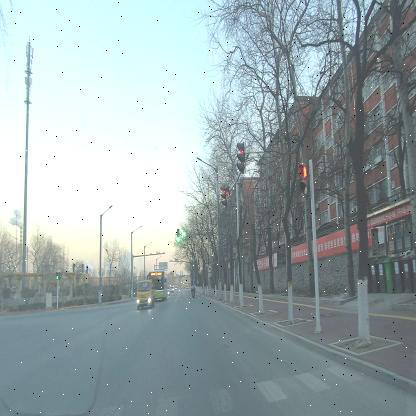
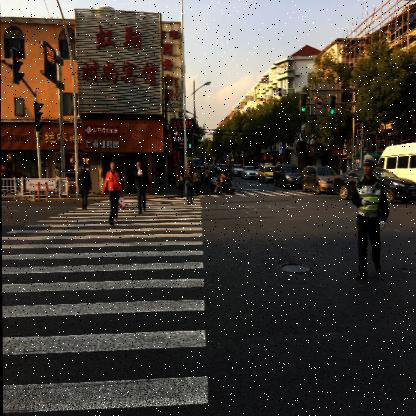
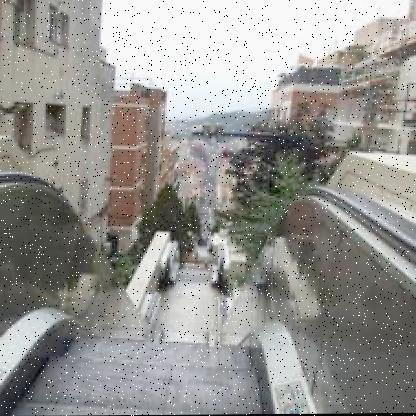
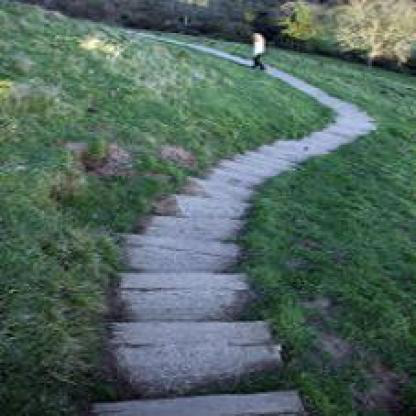


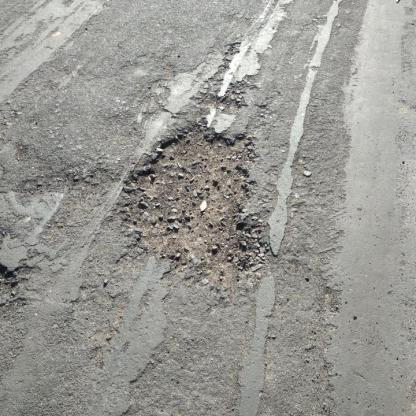
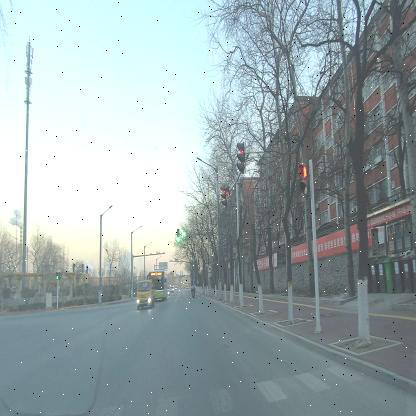
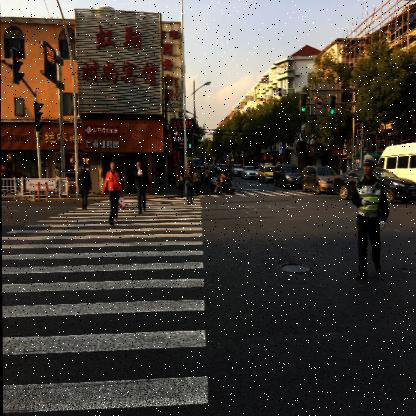
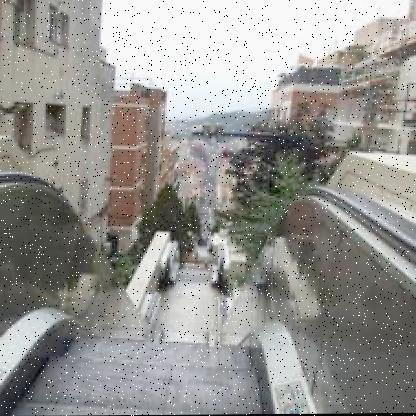
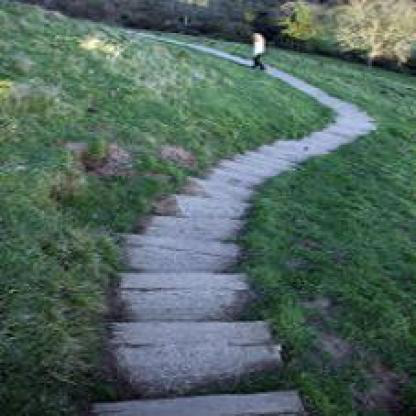

In [ ]:
path = 'train'
image_list = []

all_image_names = [image for image in os.listdir(path) if image.endswith('.jpg')]
names = random.choices(all_image_names, k = 5) 
for filename in names: 
  full_path = os.path.join(path, filename)
  if os.path.isfile(full_path):
    img = Image.open(full_path)
    image_list.append(img)
ipyplot.plot_images(image_list)

In [ ]:
path = 'train'
labels = []

all_labels_names = [label for label in os.listdir(path) if label.endswith('.txt')] 
names = random.choices(all_labels_names, k = 5) 
for filename in names: 
  full_path = os.path.join(path, filename)
  if os.path.isfile(full_path):
    labels.append(full_path)
labels

['train/00--15-_png_jpg.rf.aa2ea05396fff1ee6bb5b9abdfeb47c7.txt',
 'train/heon_IMG_0730_JPG_jpg.rf.4a8ee8b8aaaf9c37d917ccc43d1eee15.txt',
 'train/car_759_jpg.rf.6ee4712aa953d45f5dd56c2439777642.txt',
 'train/7_jpg.rf.4470aa56de6de898fb6736eb3b040d9f.txt',
 'train/c2_p1_104_jpg.rf.ae87f1789314c12fe2ae11e0a10da25e.txt']


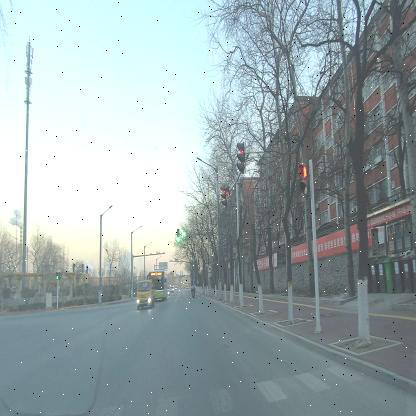
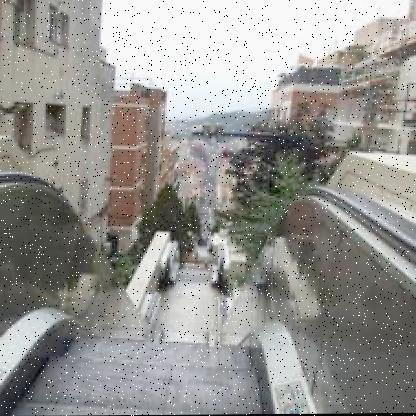
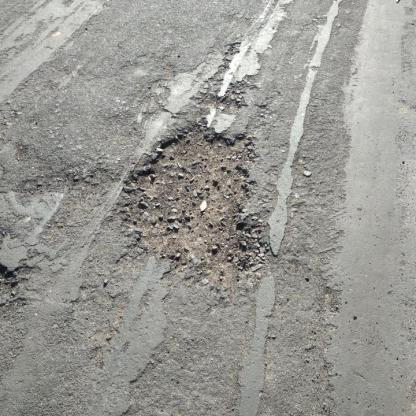
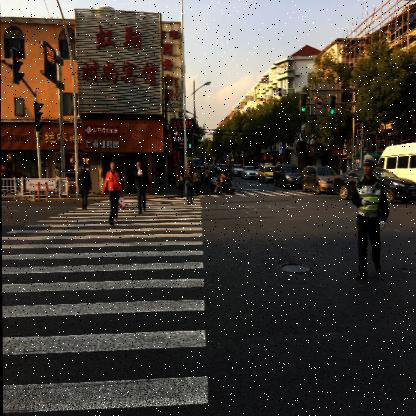
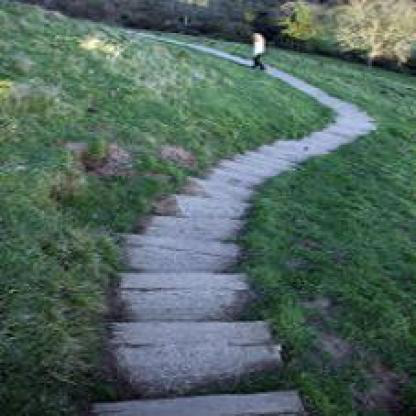


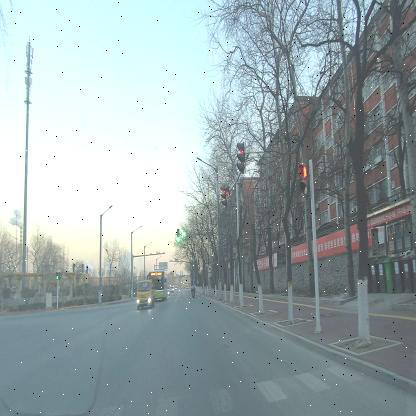
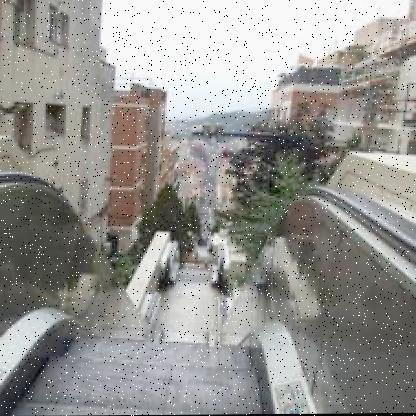
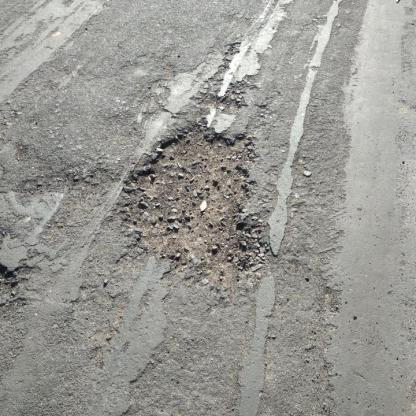
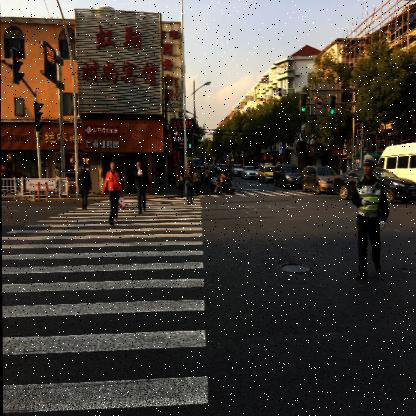
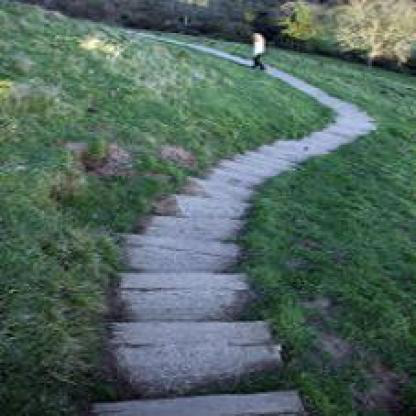

In [ ]:
labels = ['cruces', 'autos', 'motos', 'cordon', 'personas']
ipyplot.plot_class_tabs(image_list, labels, max_imgs_per_tab = 10, img_width = 150)

## Cargando etiquetas y archivos

Asigno la **ruta del archivo** de las anotaciones a una variable

In [13]:
path_lbl = '/content/gdrive/MyDrive/Proyecto 4to/I.A/Anotaciones/labels.txt'

Abro el **archivo de anotaciones** y lo *recorro linea por linea*, *eliminando los espacios* y metiendo los `strings` en una `lista`

In [14]:
with open(path_lbl) as f:
   labels = [line.strip() for line in f.readlines()]
labels

['cordon',
 'autos',
 'personas',
 'cruces',
 'pozos',
 'parar',
 'cruzar',
 'bicicleta',
 'moto',
 'escalones']

Usando el **arhcivo de labels**, le asigno un *valor numerico* para que la `IA` pueda interpretar las anotaciones

In [15]:
assigned_labels = { i : labels[i] for i in range(0, len(labels) ) }
assigned_labels

{0: 'cordon',
 1: 'autos',
 2: 'personas',
 3: 'cruces',
 4: 'pozos',
 5: 'parar',
 6: 'cruzar',
 7: 'bicicleta',
 8: 'moto',
 9: 'escalones'}

Selecciono todos los archivos de la carpeta **train** que terminen tanto en **.jpg** como en **.txt** 

In [16]:
path = 'train'

x_train = [image for image in os.listdir(path) if image.endswith('.jpg')]
y_train = [label for label in os.listdir(path) if label.endswith('.txt')]

Selecciono todos los archivos de la carpeta **test** que terminen tanto en **.jpg** como en **.txt** 

In [17]:
path = 'test'

x_test = [image for image in os.listdir(path) if image.endswith('.jpg')]
y_test = [label for label in os.listdir(path) if label.endswith('.txt')]

Selecciono todos los archivos de la carpeta **valid** que terminen tanto en **.jpg** como en **.txt** 

In [18]:
path = 'valid'

x_val = [image for image in os.listdir(path) if image.endswith('.jpg')]
y_val = [label for label in os.listdir(path) if label.endswith('.txt')]

In [ ]:
path = 'IBODS_LBL-1/train'
filename = '_annotations.csv'
full_path = os.path.join(path, filename )
train_y_csv = pd.read_csv(full_path)
train_y_csv

FileNotFoundError: ignored

## Demostramiento del funcionamiento de una IA

In [ ]:
def show_extraction(image,
                    kernel,
                    conv_stride=1,
                    conv_padding='valid',
                    activation='relu',
                    pool_size=2,
                    pool_stride=2,
                    pool_padding='same',
                    figsize=(10, 10),
                    subplot_shape=(2, 2),
                    ops=['Input', 'Filter', 'Detect', 'Condense'],
                    gamma=1.0):
    # Create Layers
    model = tf.keras.Sequential([
                    tf.keras.layers.Conv2D(
                        filters=1,
                        kernel_size=kernel.shape,
                        strides=conv_stride,
                        padding=conv_padding,
                        use_bias=False,
                        input_shape=image.shape,
                    ),
                    tf.keras.layers.Activation(activation),
                    tf.keras.layers.MaxPool2D(
                        pool_size=pool_size,
                        strides=pool_stride,
                        padding=pool_padding,
                    ),
                   ])

    layer_filter, layer_detect, layer_condense = model.layers
    kernel = tf.reshape(kernel, [*kernel.shape, 1, 1])
    layer_filter.set_weights([kernel])

    # Format for TF
    image = tf.expand_dims(image, axis=0)
    image = tf.image.convert_image_dtype(image, dtype=tf.float32) 
    
    # Extract Feature
    image_filter = layer_filter(image)
    image_detect = layer_detect(image_filter)
    image_condense = layer_condense(image_detect)
    
    images = {}
    if 'Input' in ops:
        images.update({'Input': (image, 1.0)})
    if 'Filter' in ops:
        images.update({'Filter': (image_filter, 1.0)})
    if 'Detect' in ops:
        images.update({'Detect': (image_detect, gamma)})
    if 'Condense' in ops:
        images.update({'Condense': (image_condense, gamma)})
    
    # Plot
    plt.figure(figsize=figsize)
    for i, title in enumerate(ops):
        image, gamma = images[title]
        plt.subplot(*subplot_shape, i+1)
        plt.imshow(tf.image.adjust_gamma(tf.squeeze(image), gamma))
        plt.axis('off')
        plt.title(title)

In [ ]:
def circle(size, val=None, r_shrink=0):
    circle = np.zeros([size[0]+1, size[1]+1])
    rr, cc = draw.circle_perimeter(
        size[0]//2, size[1]//2,
        radius=size[0]//2 - r_shrink,
        shape=[size[0]+1, size[1]+1],
    )
    if val is None:
        circle[rr, cc] = np.random.uniform(size=circle.shape)[rr, cc]
    else:
        circle[rr, cc] = val
    circle = transform.resize(circle, size, order=0)
    return circle


In [ ]:
def show_kernel(kernel, label=True, digits=None, text_size=28):
    # Format kernel
    kernel = np.array(kernel)
    if digits is not None:
        kernel = kernel.round(digits)

    # Plot kernel
    cmap = plt.get_cmap('Blues_r')
    plt.imshow(kernel, cmap=cmap)
    rows, cols = kernel.shape
    thresh = (kernel.max()+kernel.min())/2
    # Optionally, add value labels
    if label:
        for i, j in product(range(rows), range(cols)):
            val = kernel[i, j]
            color = cmap(0) if val > thresh else cmap(255)
            plt.text(j, i, val, 
                     color=color, size=text_size,
                     horizontalalignment='center', verticalalignment='center')
    plt.xticks([])
    plt.yticks([])

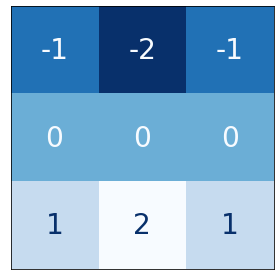

In [ ]:
plt.rc('figure', autolayout=True)
plt.rc('axes', labelweight='bold', labelsize='large',
       titleweight='bold', titlesize=18, titlepad=10)
plt.rc('image', cmap='magma')

image = circle([64, 64], val=1.0, r_shrink=3)
image = tf.reshape(image, [*image.shape, 1])
# Bottom sobel
kernel = tf.constant(
    [[-1, -2, -1],
     [0, 0, 0],
     [1, 2, 1]],
)

show_kernel(kernel)

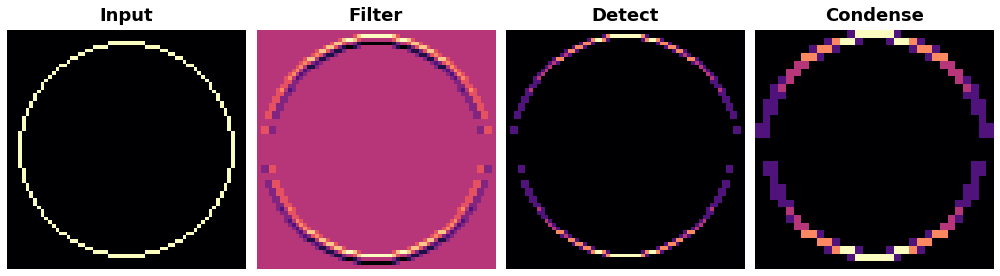

In [ ]:
show_extraction(
    image, kernel,

    # Window parameters
    conv_stride=1,
    pool_size=2,
    pool_stride=2,

    subplot_shape=(1, 4),
    figsize=(14, 6),
)

## Normalizar Dataset

In [ ]:
def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

In [ ]:
def normalizar_dataset(dataset, path):
  list_of_tensors = []
  for images_names in dataset:
    full_path = os.path.join(path, images_names)
    image = cv2.imread(full_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    transform = transforms.Compose([
    transforms.ToTensor()])
    img_tensor = transform(image)
    list_of_tensors.append(img_tensor)
  return list_of_tensors

In [ ]:
def normalizar_dataset_np (dataset, path):
  for images_names in dataset:
    full_path = os.path.join(path, images_names)
    image = cv2.imread(full_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    array_img = np.asarray(image)
  return array_img

In [ ]:
def read_dataset (dataset, path):
  images_norm = []
  for images_names in dataset:
    full_path = os.path.join(path, images_names)
    img_arr = imread(full_path)
    norm_img = NormalizeData(img_arr)
    images_norm.append(norm_img)
  return images_norm

In [ ]:
def array_keras_images(dataset, path):
  for images_names in dataset:
    full_path = os.path.join(path, images_names)
    image = cv2.imread(full_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img = tf.keras.preprocessing.image.load_img(image)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
  return img_array

In [ ]:
path = 'train'
list_arr = []
for images_names in x_train:
  full_path = os.path.join(path, images_names)
  images = cv2.imread(full_path)
  images = np.array(images)
  images = images.astype('float32') / 255.0
  list_arr.append(images)
list_arr

KeyboardInterrupt: ignored

## Funciones Utiles y configuracion

In [19]:
CLASSES = labels

In [20]:
COLORS = np.random.randint(0, 255, size=(len(CLASSES), 3), dtype=np.uint8)

In [21]:
def preprocess_image(image_path, input_size):
  ''' Preprocess the input image to feed to the TFLite model
  '''
  img = tf.io.read_file(image_path)
  img = tf.io.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.uint8)
  original_image = img
  resized_img = tf.image.resize(img, input_size)
  resized_img = resized_img[tf.newaxis, :]
  resized_img = tf.cast(resized_img, dtype=tf.uint8)
  return resized_img, original_image

In [22]:
def detect_objects(interpreter, image, threshold):
  ''' Returns a list of detection results, each a dictionary of object info.
  '''

  signature_fn = interpreter.get_signature_runner()

  # Feed the input image to the model
  output = signature_fn(images=image)

  # Get all outputs from the model
  count = int(np.squeeze(output['output_0']))
  scores = np.squeeze(output['output_1'])
  classes = np.squeeze(output['output_2'])
  boxes = np.squeeze(output['output_3'])

  results = []
  for i in range(count):
    if scores[i] >= threshold:
      result = {
        'bounding_box': boxes[i],
        'class_id': classes[i],
        'score': scores[i]
      }
      results.append(result)
  return results


In [23]:
def run_odt_and_draw_results(image_path, interpreter, threshold=0.5):
  ''' Run object detection on the input image and draw the detection results
  '''
  
  # Load the input shape required by the model
  _, input_height, input_width, _ = interpreter.get_input_details()[0]['shape']

  # Load the input image and preprocess it
  preprocessed_image, original_image = preprocess_image(
      image_path,
      (input_height, input_width)
    )

  # Run object detection on the input image
  results = detect_objects(interpreter, preprocessed_image, threshold=threshold)

  # Plot the detection results on the input image
  original_image_np = original_image.numpy().astype(np.uint8)
  for obj in results:
    # Convert the object bounding box from relative coordinates to absolute
    # coordinates based on the original image resolution
    ymin, xmin, ymax, xmax = obj['bounding_box']
    xmin = int(xmin * original_image_np.shape[1])
    xmax = int(xmax * original_image_np.shape[1])
    ymin = int(ymin * original_image_np.shape[0])
    ymax = int(ymax * original_image_np.shape[0])

    # Find the class index of the current object
    class_id = int(obj['class_id'])

    # Draw the bounding box and label on the image
    color = [int(c) for c in COLORS[class_id]]
    cv2.rectangle(original_image_np, (xmin, ymin), (xmax, ymax), color, 2)
    # Make adjustments to make the label visible for all objects
    y = ymin - 15 if ymin - 15 > 15 else ymin + 15
    label = "{}: {:.0f}%".format(CLASSES[class_id], obj['score'] * 100)
    cv2.putText(original_image_np, label, (xmin, y),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

  # Return the final image
  original_uint8 = original_image_np.astype(np.uint8)
  return original_uint8

## Cargar Dataset

### Cargo los datos de entrenamiento

In [24]:
TRAIN_PATH = 'IBODS_LBL-1/train'

In [25]:
train_data = object_detector.DataLoader.from_pascal_voc(
    TRAIN_PATH,
    TRAIN_PATH,
    labels
)

### Cargo los datos de validacion

In [26]:
VALID_PATH = 'IBODS_LBL-1/valid'

In [27]:
valid_data = object_detector.DataLoader.from_pascal_voc(
    VALID_PATH,
    VALID_PATH,
    labels
)

### Cargo los datos de testeo

In [28]:
TEST_PATH = 'IBODS_LBL-1/test'

In [29]:
test_data = object_detector.DataLoader.from_pascal_voc(
    TEST_PATH,
    TEST_PATH,
    labels
)

### Configuracion para la TPU

In [ ]:
os.environ["TFHUB_MODEL_LOAD_FORMAT"] = "UNCOMPRESSED"
hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)

In [ ]:
hub.resolve('IBODS_LBL-1/train')

'IBODS_LBL-1/train'

In [ ]:
spec = object_detector.EfficientDetLite0Spec(tflite_max_detections=10,
                                             strategy='tpu', tpu=tpu.master(), debug=True)

Instructions for updating:
Use `tf.config.run_functions_eagerly` instead of the experimental version.
INFO:absl:All devices: [LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:0', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:1', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:2', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:3', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:4', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:5', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:6', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:7', device_type='TPU')]


## Entrenamiento de la IA

In [ ]:
model = object_detector.create(
    train_data,
    model_spec= 'efficientdet_lite1',
    batch_size= 8,
    train_whole_model=True,
    epochs=100,
    validation_data=valid_data
)

Epoch 1/100
307/307 [==============================] - 159s 377ms/step - det_loss: 1.2165 - cls_loss: 0.8017 - box_loss: 0.0083 - reg_l2_loss: 0.0723 - loss: 1.2888 - learning_rate: 0.0090 - gradient_norm: 3.7408 - val_det_loss: 1.0581 - val_cls_loss: 0.6647 - val_box_loss: 0.0079 - val_reg_l2_loss: 0.0728 - val_loss: 1.1308
Epoch 2/100
307/307 [==============================] - 112s 365ms/step - det_loss: 0.8170 - cls_loss: 0.5190 - box_loss: 0.0060 - reg_l2_loss: 0.0733 - loss: 0.8903 - learning_rate: 0.0100 - gradient_norm: 4.1694 - val_det_loss: 1.0146 - val_cls_loss: 0.6530 - val_box_loss: 0.0072 - val_reg_l2_loss: 0.0738 - val_loss: 1.0883
Epoch 3/100
307/307 [==============================] - 112s 364ms/step - det_loss: 0.7327 - cls_loss: 0.4593 - box_loss: 0.0055 - reg_l2_loss: 0.0742 - loss: 0.8069 - learning_rate: 0.0100 - gradient_norm: 3.9628 - val_det_loss: 0.8590 - val_cls_loss: 0.5429 - val_box_loss: 0.0063 - val_reg_l2_loss: 0.0746 - val_loss: 0.9336
Epoch 4/100
307/307

## Testeo de la IA y su performance

In [ ]:
model.evaluate(test_data)

6/6 [==============================] - 52s 3s/step



{'AP': 0.5017972,
 'AP50': 0.7193609,
 'AP75': 0.543029,
 'APs': 0.20625104,
 'APm': 0.5413953,
 'APl': 0.74432534,
 'ARmax1': 0.42042524,
 'ARmax10': 0.5715316,
 'ARmax100': 0.599172,
 'ARs': 0.3604337,
 'ARm': 0.6604144,
 'ARl': 0.8064427,
 'AP_/cordon': 0.26094756,
 'AP_/autos': 0.6174356,
 'AP_/personas': 0.39008668,
 'AP_/cruces': 0.75657016,
 'AP_/pozos': 0.6283797,
 'AP_/parar': 0.022782769,
 'AP_/cruzar': 0.1413593,
 'AP_/bicicleta': 0.80509084,
 'AP_/moto': 0.7264423,
 'AP_/escalones': 0.6688768}

## Salvo el modelo

In [ ]:
logs_dir = "gdrive/My\ Drive/Proyecto\ 4to/I.A/Logs" 

In [30]:
os.mkdir('logs')

In [ ]:
model.export(export_dir='logs')

In [ ]:
model.evaluate_tflite('logs/model.tflite', test_data)

315/351 [=========================>....] - ETA: 2:50

KeyboardInterrupt: ignored

## Quantization

In [ ]:
config = QuantizationConfig.for_float16()

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model('logs')
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_types = [tf.float16]
tflite_quant_model = converter.convert()

OSError: ignored

## Deteccion

### Deteccion **simple** fotos

In [31]:
detector = vision.ObjectDetector.create_from_file('logs/model1.tflite')

In [32]:
tensor_image = vision.TensorImage.create_from_file('IBODS_LBL-1/test/Audi_A7_2012_59_18_310_30_6_75_55_195_18_AWD_4_4_4dr_aqB_jpg.rf.2cdf87614d0d1c937d1e97bbdd338b2c.jpg')

In [35]:
detector.detect(tensor_image)

DetectionResult(detections=[Detection(bounding_box=BoundingBox(origin_x=8, origin_y=65, width=406, height=318), categories=[Category(index=1, score=0.9921875, display_name='', category_name='autos')]), Detection(bounding_box=BoundingBox(origin_x=133, origin_y=16, width=11, height=16), categories=[Category(index=5, score=0.0703125, display_name='', category_name='parar')]), Detection(bounding_box=BoundingBox(origin_x=131, origin_y=17, width=8, height=10), categories=[Category(index=5, score=0.0546875, display_name='', category_name='parar')]), Detection(bounding_box=BoundingBox(origin_x=136, origin_y=16, width=10, height=11), categories=[Category(index=5, score=0.0390625, display_name='', category_name='parar')]), Detection(bounding_box=BoundingBox(origin_x=2, origin_y=25, width=10, height=198), categories=[Category(index=2, score=0.01953125, display_name='', category_name='personas')]), Detection(bounding_box=BoundingBox(origin_x=0, origin_y=-1, width=29, height=225), categories=[Categ

### Deteccion **compleja** fotos

In [ ]:
cwd = os.getcwd()
os.mkdir(f'{cwd}/result')

In [ ]:
cwd = os.getcwd()

DETECTION_THRESHOLD = 0.3

# Change the test file path to your test image
INPUT_IMAGE_PATH = 'IBODS_LBL-1/test/Audi_A7_2012_59_18_310_30_6_75_55_195_18_AWD_4_4_4dr_aqB_jpg.rf.2cdf87614d0d1c937d1e97bbdd338b2c.jpg'

im = Image.open(INPUT_IMAGE_PATH)
im.thumbnail((512, 512), Image.ANTIALIAS)
im.save(f'{cwd}/result/input.png','PNG')

# Load the TFLite model
model_path = 'logs/model1.tflite'
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Run inference and draw detection result on the local copy of the original file
detection_result_image = run_odt_and_draw_results(
    INPUT_IMAGE_PATH,
    interpreter,
    threshold=DETECTION_THRESHOLD
)

# Show the detection result
img = Image.fromarray(detection_result_image)
img.save(f'{cwd}/result/ouput.png')

### Deteccion en video

In [1]:
detector = vision.ObjectDetector.create_from_file('logs/model1.tflite')

import cv2

cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("No se puede abrir la camara")
    exit()

while True:
  ret,frame = cap.read() # Voy agarrando los frames

  if ret == True: # Si leyo correctamente los frames, signfica que el retun (ret) es true, por lo que ejecuto el codigo en ese caso
    cv2.cvtColor(frame, cv2.COLOR_BGRRGB) # Convierto todos los frames al espectro RGB
    tensor_image = vision.TensorImage.create_from_array(frame) # Convierto todos los frames a tensores
    detector.detect(tensor_image)
    key = cv2.waitKey(1)
    if key == ord('q'):
      break
  if not ret:
        print("No puedo recibir imagenes (finalizaste la trasmision?). Saliendo ...")
        break
cap.release()
cv2.destroyAllWindows()

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory(
      'realtrain',
      target_size=(224, 224),
      color_mode='rgb',
      batch_size=32,
      class_mode="categorical"
)

Found 2459 images belonging to 1 classes.


In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
test_generator = train_datagen.flow_from_directory(
      'realtest',
      target_size=(224, 224),
      color_mode='rgb',
      batch_size=32,
      class_mode="categorical"
)

Found 351 images belonging to 1 classes.


In [ ]:
train_iterator = train_datagen.flow(
    x = x_train,
    y = y_train,
    batch_size=32
)

TypeError: ignored

In [ ]:
test = np.loadtxt('train/----------_jpg.rf.4601db75498aceb73120eec23e2b6d06.txt')
test

array([2.        , 0.84975962, 0.5       , 0.30048077, 1.        ])

In [ ]:
test2 = np.loadtxt('train/-_jpg.rf.3b14ecfcad0969be42b85cd78321f0a9.txt')
test2

array([2.        , 0.49879808, 0.60336538, 0.99759615, 0.35096154])

In [ ]:
test3 = np.loadtxt('train/00--1-_png_jpg.rf.972de0c17f54fb632cde8a844909899a.txt')
test3

array([[8.        , 0.31009615, 0.86177885, 0.13221154, 0.27644231],
       [0.        , 0.62379808, 0.83653846, 0.53125   , 0.32692308],
       [2.        , 0.06610577, 0.91826923, 0.13221154, 0.05769231],
       [2.        , 0.11899038, 0.875     , 0.23798077, 0.02163462]])

In [ ]:
y_tr = []
path = 'train'
for y in y_train:
  full_path = os.path.join(path, y)
  arr_lbl = np.loadtxt(full_path)
  y_tr.append(arr_lbl)
y_tr

[array([6.        , 0.50480769, 0.49519231, 0.97836538, 0.88701923]),
 array([1.        , 0.49759615, 0.47836538, 0.99519231, 0.94711538]),
 array([[0.        , 0.30889423, 0.74639423, 0.11538462, 0.13221154],
        [0.        , 0.44711538, 0.74399038, 0.04807692, 0.05048077],
        [0.        , 0.61658654, 0.74639423, 0.04326923, 0.05769231],
        [0.        , 0.69591346, 0.74759615, 0.04807692, 0.05769231],
        [0.        , 0.49038462, 0.734375  , 0.02884615, 0.04086538]]),
 array([0.        , 0.51322115, 0.70192308, 0.59615385, 0.45913462]),
 array([[0.        , 0.27283654, 0.40625   , 0.50240385, 0.30288462],
        [0.        , 0.73197115, 0.41225962, 0.41826923, 0.35576923]]),
 array([[0.        , 0.36418269, 0.78846154, 0.20192308, 0.21875   ],
        [0.        , 0.62980769, 0.80649038, 0.40865385, 0.37019231],
        [8.        , 0.92668269, 0.72716346, 0.02644231, 0.06490385],
        [8.        , 0.15264423, 0.80889423, 0.20913462, 0.37259615],
        [6.     

In [ ]:
len(list_arr)

5528

In [ ]:
image = cv2.imread('train/----------_jpg.rf.4601db75498aceb73120eec23e2b6d06.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
transform = transforms.Compose([transforms.ToTensor()])
img_tensor = transform(image)
print(img_tensor)

tensor([[[0.6275, 0.6275, 0.6235,  ..., 0.5647, 0.6196, 0.6431],
         [0.6275, 0.6235, 0.6235,  ..., 0.5882, 0.6353, 0.6549],
         [0.6275, 0.6275, 0.6275,  ..., 0.6235, 0.6510, 0.6627],
         ...,
         [0.3608, 0.3804, 0.4157,  ..., 0.3961, 0.4000, 0.3961],
         [0.3608, 0.3804, 0.4157,  ..., 0.3961, 0.3961, 0.3961],
         [0.3725, 0.3922, 0.4196,  ..., 0.3922, 0.3961, 0.3922]],

        [[0.6471, 0.6471, 0.6431,  ..., 0.5451, 0.5961, 0.6196],
         [0.6471, 0.6431, 0.6431,  ..., 0.5686, 0.6118, 0.6314],
         [0.6431, 0.6431, 0.6431,  ..., 0.6039, 0.6275, 0.6392],
         ...,
         [0.3647, 0.3843, 0.4196,  ..., 0.3804, 0.3765, 0.3725],
         [0.3647, 0.3843, 0.4196,  ..., 0.3804, 0.3725, 0.3725],
         [0.3765, 0.3961, 0.4235,  ..., 0.3765, 0.3725, 0.3686]],

        [[0.6588, 0.6588, 0.6549,  ..., 0.5608, 0.6118, 0.6353],
         [0.6588, 0.6549, 0.6549,  ..., 0.5843, 0.6275, 0.6471],
         [0.6549, 0.6549, 0.6549,  ..., 0.6196, 0.6431, 0.

In [ ]:
image = cv2.imread('train/----------_jpg.rf.4601db75498aceb73120eec23e2b6d06.jpg')
image = np.array(image)
image = image.astype('float32') / 255.0
image

array([[[0.65882355, 0.64705884, 0.627451  ],
        [0.65882355, 0.64705884, 0.627451  ],
        [0.654902  , 0.6431373 , 0.62352943],
        ...,
        [0.56078434, 0.54509807, 0.5647059 ],
        [0.6117647 , 0.59607846, 0.61960787],
        [0.63529414, 0.61960787, 0.6431373 ]],

       [[0.65882355, 0.64705884, 0.627451  ],
        [0.654902  , 0.6431373 , 0.62352943],
        [0.654902  , 0.6431373 , 0.62352943],
        ...,
        [0.58431375, 0.5686275 , 0.5882353 ],
        [0.627451  , 0.6117647 , 0.63529414],
        [0.64705884, 0.6313726 , 0.654902  ]],

       [[0.654902  , 0.6431373 , 0.627451  ],
        [0.654902  , 0.6431373 , 0.627451  ],
        [0.654902  , 0.6431373 , 0.627451  ],
        ...,
        [0.61960787, 0.6039216 , 0.62352943],
        [0.6431373 , 0.627451  , 0.6509804 ],
        [0.654902  , 0.6392157 , 0.6627451 ]],

       ...,

       [[0.38039216, 0.3647059 , 0.36078432],
        [0.4       , 0.38431373, 0.38039216],
        [0.43529412, 0

In [ ]:
image = cv2.imread('train/-_jpg.rf.03df5be66076477694c2b233c20dae3e.jpg')
image

array([[[ 92,  84,  77],
        [102,  94,  87],
        [ 91,  83,  76],
        ...,
        [  6,   2,   1],
        [  6,   2,   1],
        [  5,   1,   0]],

       [[ 89,  81,  74],
        [ 96,  88,  81],
        [ 91,  83,  76],
        ...,
        [  5,   1,   0],
        [  4,   0,   0],
        [  4,   0,   0]],

       [[ 99,  91,  84],
        [ 98,  90,  83],
        [ 97,  89,  82],
        ...,
        [  6,   2,   1],
        [  5,   1,   0],
        [  5,   1,   0]],

       ...,

       [[138, 137, 123],
        [135, 134, 120],
        [131, 130, 116],
        ...,
        [ 12,  13,  11],
        [  0,   1,   0],
        [ 14,  15,  13]],

       [[134, 133, 119],
        [129, 128, 114],
        [147, 146, 132],
        ...,
        [  8,   9,   7],
        [  0,   1,   0],
        [  0,   1,   0]],

       [[136, 135, 121],
        [136, 135, 121],
        [130, 129, 115],
        ...,
        [  0,   1,   0],
        [ 16,  17,  15],
        [  6,   7,   5]]

In [ ]:
imageg = imread('train/-_jpg.rf.03df5be66076477694c2b233c20dae3e.jpg')
imageg

array([[[ 77,  84,  92],
        [ 87,  94, 102],
        [ 76,  83,  91],
        ...,
        [  1,   2,   6],
        [  1,   2,   6],
        [  0,   1,   5]],

       [[ 74,  81,  89],
        [ 81,  88,  96],
        [ 76,  83,  91],
        ...,
        [  0,   1,   5],
        [  0,   0,   4],
        [  0,   0,   4]],

       [[ 84,  91,  99],
        [ 83,  90,  98],
        [ 82,  89,  97],
        ...,
        [  1,   2,   6],
        [  0,   1,   5],
        [  0,   1,   5]],

       ...,

       [[123, 137, 138],
        [120, 134, 135],
        [116, 130, 131],
        ...,
        [ 11,  13,  12],
        [  0,   1,   0],
        [ 13,  15,  14]],

       [[119, 133, 134],
        [114, 128, 129],
        [132, 146, 147],
        ...,
        [  7,   9,   8],
        [  0,   1,   0],
        [  0,   1,   0]],

       [[121, 135, 136],
        [121, 135, 136],
        [115, 129, 130],
        ...,
        [  0,   1,   0],
        [ 15,  17,  16],
        [  5,   7,   6]]

In [ ]:
NormalizeData(imageg)

array([[[0.30196078, 0.32941176, 0.36078431],
        [0.34117647, 0.36862745, 0.4       ],
        [0.29803922, 0.3254902 , 0.35686275],
        ...,
        [0.00392157, 0.00784314, 0.02352941],
        [0.00392157, 0.00784314, 0.02352941],
        [0.        , 0.00392157, 0.01960784]],

       [[0.29019608, 0.31764706, 0.34901961],
        [0.31764706, 0.34509804, 0.37647059],
        [0.29803922, 0.3254902 , 0.35686275],
        ...,
        [0.        , 0.00392157, 0.01960784],
        [0.        , 0.        , 0.01568627],
        [0.        , 0.        , 0.01568627]],

       [[0.32941176, 0.35686275, 0.38823529],
        [0.3254902 , 0.35294118, 0.38431373],
        [0.32156863, 0.34901961, 0.38039216],
        ...,
        [0.00392157, 0.00784314, 0.02352941],
        [0.        , 0.00392157, 0.01960784],
        [0.        , 0.00392157, 0.01960784]],

       ...,

       [[0.48235294, 0.5372549 , 0.54117647],
        [0.47058824, 0.5254902 , 0.52941176],
        [0.45490196, 0

In [ ]:
x_tr = read_dataset(x_train, 'train')

In [ ]:
norm_train_x = normalizar_dataset(x_train, 'train')

In [ ]:
norm_val_x = normalizar_dataset(x_val, 'valid')

In [ ]:
type(norm_train_x)

list

In [ ]:
len(norm_train_x)

2459

In [ ]:
norm_train_x

[tensor([[[0.8157, 0.8196, 0.8510,  ..., 0.0000, 0.0000, 0.0000],
          [0.8314, 0.8157, 0.8235,  ..., 0.0078, 0.0000, 0.0000],
          [0.8196, 0.8235, 0.8078,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0824, 0.0588, 0.2353,  ..., 0.0039, 0.0039, 0.0392],
          [0.1137, 0.1490, 0.2000,  ..., 0.0039, 0.0549, 0.0039],
          [0.0549, 0.1294, 0.2078,  ..., 0.0039, 0.0039, 0.0039]],
 
         [[0.8314, 0.8353, 0.8667,  ..., 0.0000, 0.0039, 0.0039],
          [0.8471, 0.8314, 0.8392,  ..., 0.0118, 0.0039, 0.0000],
          [0.8353, 0.8392, 0.8235,  ..., 0.0039, 0.0000, 0.0000],
          ...,
          [0.0118, 0.0000, 0.1686,  ..., 0.0000, 0.0000, 0.0353],
          [0.0431, 0.0784, 0.1333,  ..., 0.0000, 0.0510, 0.0000],
          [0.0000, 0.0588, 0.1412,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.8431, 0.8471, 0.8784,  ..., 0.0078, 0.0118, 0.0118],
          [0.8588, 0.8431, 0.8510,  ..., 0.0196, 0.0118, 0.0078],
          [0.8471, 0.8510, 0.8353,  ...,

In [ ]:
test = normalizar_dataset_np(x_train, 'train')
test

array([[[139, 175, 209],
        [139, 175, 209],
        [139, 175, 209],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[139, 175, 209],
        [139, 175, 209],
        [139, 175, 209],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[139, 175, 209],
        [139, 175, 209],
        [139, 175, 209],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[106, 113, 121],
        [106, 113, 121],
        [106, 113, 121],
        ...,
        [ 21,  23,  20],
        [ 27,  29,  28],
        [ 24,  26,  25]],

       [[104, 111, 119],
        [104, 111, 119],
        [104, 111, 119],
        ...,
        [ 21,  23,  20],
        [ 27,  29,  28],
        [ 24,  26,  25]],

       [[105, 112, 120],
        [105, 112, 120],
        [105, 112, 120],
        ...,
        [ 21,  23,  20],
        [ 27,  29,  28],
        [ 24,  26,  25]]

In [ ]:
x = NormalizeData(test)
x

array([[[0.52066116, 0.66942149, 0.80991736],
        [0.52066116, 0.66942149, 0.80991736],
        [0.52066116, 0.66942149, 0.80991736],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       [[0.52066116, 0.66942149, 0.80991736],
        [0.52066116, 0.66942149, 0.80991736],
        [0.52066116, 0.66942149, 0.80991736],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       [[0.52066116, 0.66942149, 0.80991736],
        [0.52066116, 0.66942149, 0.80991736],
        [0.52066116, 0.66942149, 0.80991736],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ]],

       ...,

       [[0.38429752, 0.41322314, 0.44628099],
        [0.38429752, 0.41322314, 0.44628099],
        [0.38429752, 0

In [ ]:
test.shape

(416, 416, 3)

416

In [ ]:
f = test[0]
f

array([[255, 255, 255],
       [255, 255, 255],
       [255, 255, 255],
       ...,
       [  0,   0,   0],
       [  4,   4,   4],
       [ 11,  11,  11]], dtype=uint8)

In [ ]:
x = NormalizeData(f)
x

array([[1.        , 1.        , 1.        ],
       [1.        , 1.        , 1.        ],
       [1.        , 1.        , 1.        ],
       ...,
       [0.        , 0.        , 0.        ],
       [0.01568627, 0.01568627, 0.01568627],
       [0.04313725, 0.04313725, 0.04313725]])

In [ ]:
array_keras_images(x_train, 'train')

TypeError: ignored

In [ ]:
len(test)

NameError: ignored

In [ ]:
train_path = os.mkdir('./train')

FileExistsError: ignored

In [ ]:
ds_train = tf.keras.preprocessing.image_dataset_from_directory(
    'IBODS_LBL-1/train2',
    labels='inferred',
    label_mode='int',
    image_size=[416, 416],
    interpolation='nearest',
    batch_size=64,
    shuffle=True,   
)

Found 2459 files belonging to 1 classes.


In [ ]:
ds_train = tf.keras.utils.image_dataset_from_directory('./train')

Found 0 files belonging to 0 classes.


ValueError: ignored

# Creo el modelo

In [ ]:
test_model = keras.Sequential([
  keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding = 'same', input_shape=(224, 224, 3)),
  keras.layers.MaxPool2D(pool_size=(2, 2), strides = (2, 2)),
  keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding = 'same'),
  keras.layers.MaxPool2D(pool_size=(2, 2), strides = (2, 2)),
  keras.layers.Flatten(),
  keras.layers.Dense(10, activation = "softmax")
])

NameError: ignored

In [ ]:
test_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 112, 112, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 56, 56, 64)       0         
 g2D)                                                            
                                                                 
 flatten_6 (Flatten)         (None, 200704)            0         
                                                                 
 dense_6 (Dense)             (None, 10)               

In [ ]:
model = keras.Sequential()

In [ ]:
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(416,416,3)))
model.add(MaxPooling2D())
model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(10))

ValueError: ignored

In [ ]:
model = keras.Sequential()
model.add(keras.Input(shape=(416, 416, 3)))  # 416x416 RGB images
model.add(layers.Conv2D(32, 5, strides=2, activation="relu"))
model.add(layers.Conv2D(32, 3, activation="relu"))
model.add(layers.MaxPooling2D(3))
model.add(layers.Conv2D(32, 3, activation="relu"))
model.add(layers.Conv2D(32, 3, activation="relu"))
model.add(layers.MaxPooling2D(3))
model.add(layers.Conv2D(32, 3, activation="relu"))
model.add(layers.Conv2D(32, 3, activation="relu"))
model.add(layers.MaxPooling2D(2))
model.add(layers.GlobalMaxPooling2D())

# Finally, we add a classification layer.
model.add(layers.Dense(10))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 206, 206, 32)      2432      
                                                                 
 conv2d_2 (Conv2D)           (None, 204, 204, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 68, 68, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 66, 66, 32)        9248      
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 64, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 21, 21, 32)       0         
 2D)                                                  

In [ ]:
# load the VGG16 network, ensuring the head FC layers are left off
vgg = VGG16(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))
# freeze all VGG layers so they will *not* be updated during the
# training process
vgg.trainable = False
# flatten the max-pooling output of VGG
flatten = vgg.output
flatten = Flatten()(flatten)

58900480/58889256 [==============================] - 0s 0us/step


In [ ]:
# construct a fully-connected layer header to output the predicted
# bounding box coordinates
bboxHead = Dense(128, activation="relu")(flatten)
bboxHead = Dense(64, activation="relu")(bboxHead)
bboxHead = Dense(32, activation="relu")(bboxHead)
bboxHead = Dense(4, activation="sigmoid",
	name="bounding_box")(bboxHead)
# construct a second fully-connected layer head, this one to predict
# the class label
softmaxHead = Dense(512, activation="relu")(flatten)
softmaxHead = Dropout(0.5)(softmaxHead)
softmaxHead = Dense(512, activation="relu")(softmaxHead)
softmaxHead = Dropout(0.5)(softmaxHead)
softmaxHead = Dense(10, activation="softmax",)(softmaxHead)
# put together our model which accept an input image and then output
# bounding box coordinates and a class label
model = Model(
	inputs=vgg.input,
	outputs=(bboxHead, softmaxHead))

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 224, 224, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 224, 224, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

# Configuracion

In [ ]:
early_stopping = callbacks.EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=20, # how many epochs to wait before stopping
    restore_best_weights=True,
)

In [ ]:
losses = {
	"class_label": "categorical_crossentropy",
	"bounding_box": "mean_squared_error",
}

In [ ]:
lossWeights = {
	"class_label": 1.0,
	"bounding_box": 1.0,
}

In [ ]:
model.compile(
    optimizer='adam',
    loss="categorical_crossentropy", 
    metrics=['accuracy'],
)

#Entrenamiento

In [ ]:
logdir = os.mkdir('logs')

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [ ]:
hist = model.fit(train_generator, epochs=100, batch_size = 256, callbacks=[early_stopping])

Epoch 1/100
77/77 [==============================] - ETA: 0s - loss: 38046.2773 - bounding_box_loss: 626.1146 - dense_5_loss: 37420.1562 - bounding_box_accuracy: 0.1155 - dense_5_accuracy: 0.0675

77/77 [==============================] - 19s 191ms/step - loss: 38046.2773 - bounding_box_loss: 626.1146 - dense_5_loss: 37420.1562 - bounding_box_accuracy: 0.1155 - dense_5_accuracy: 0.0675
Epoch 2/100
77/77 [==============================] - ETA: 0s - loss: 431223.0938 - bounding_box_loss: 6070.1367 - dense_5_loss: 425153.0938 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0561

77/77 [==============================] - 13s 162ms/step - loss: 431223.0938 - bounding_box_loss: 6070.1367 - dense_5_loss: 425153.0938 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0561
Epoch 3/100
77/77 [==============================] - ETA: 0s - loss: 1449883.7500 - bounding_box_loss: 4061.8242 - dense_5_loss: 1445822.2500 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0634

77/77 [==============================] - 13s 165ms/step - loss: 1449883.7500 - bounding_box_loss: 4061.8242 - dense_5_loss: 1445822.2500 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0634
Epoch 4/100
77/77 [==============================] - ETA: 0s - loss: 3180175.5000 - bounding_box_loss: 10484.5771 - dense_5_loss: 3169690.5000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0634

77/77 [==============================] - 13s 168ms/step - loss: 3180175.5000 - bounding_box_loss: 10484.5771 - dense_5_loss: 3169690.5000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0634
Epoch 5/100
77/77 [==============================] - ETA: 0s - loss: 5671780.5000 - bounding_box_loss: 23521.2363 - dense_5_loss: 5648258.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0683

77/77 [==============================] - 13s 174ms/step - loss: 5671780.5000 - bounding_box_loss: 23521.2363 - dense_5_loss: 5648258.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0683
Epoch 6/100
77/77 [==============================] - ETA: 0s - loss: 8727499.0000 - bounding_box_loss: 43242.7617 - dense_5_loss: 8684258.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0683

77/77 [==============================] - 14s 179ms/step - loss: 8727499.0000 - bounding_box_loss: 43242.7617 - dense_5_loss: 8684258.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0683
Epoch 7/100
77/77 [==============================] - ETA: 0s - loss: 12584628.0000 - bounding_box_loss: 80451.9453 - dense_5_loss: 12504175.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0695

77/77 [==============================] - 14s 182ms/step - loss: 12584628.0000 - bounding_box_loss: 80451.9453 - dense_5_loss: 12504175.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0695
Epoch 8/100
77/77 [==============================] - ETA: 0s - loss: 17002912.0000 - bounding_box_loss: 131356.1406 - dense_5_loss: 16871558.0000 - bounding_box_accuracy: 0.2668 - dense_5_accuracy: 0.0671

77/77 [==============================] - 14s 176ms/step - loss: 17002912.0000 - bounding_box_loss: 131356.1406 - dense_5_loss: 16871558.0000 - bounding_box_accuracy: 0.2668 - dense_5_accuracy: 0.0671
Epoch 9/100
77/77 [==============================] - ETA: 0s - loss: 21871190.0000 - bounding_box_loss: 231231.7656 - dense_5_loss: 21639950.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0708

77/77 [==============================] - 13s 173ms/step - loss: 21871190.0000 - bounding_box_loss: 231231.7656 - dense_5_loss: 21639950.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0708
Epoch 10/100
77/77 [==============================] - ETA: 0s - loss: 27534656.0000 - bounding_box_loss: 263995.0312 - dense_5_loss: 27270668.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0724

77/77 [==============================] - 13s 171ms/step - loss: 27534656.0000 - bounding_box_loss: 263995.0312 - dense_5_loss: 27270668.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0724
Epoch 11/100
77/77 [==============================] - ETA: 0s - loss: 34130632.0000 - bounding_box_loss: 329966.1562 - dense_5_loss: 33800656.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0720

77/77 [==============================] - 13s 172ms/step - loss: 34130632.0000 - bounding_box_loss: 329966.1562 - dense_5_loss: 33800656.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0720
Epoch 12/100
77/77 [==============================] - ETA: 0s - loss: 40355236.0000 - bounding_box_loss: 529005.7500 - dense_5_loss: 39826220.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0744

77/77 [==============================] - 14s 175ms/step - loss: 40355236.0000 - bounding_box_loss: 529005.7500 - dense_5_loss: 39826220.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0744
Epoch 13/100
77/77 [==============================] - ETA: 0s - loss: 47332648.0000 - bounding_box_loss: 571789.9375 - dense_5_loss: 46760852.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0704

77/77 [==============================] - 14s 177ms/step - loss: 47332648.0000 - bounding_box_loss: 571789.9375 - dense_5_loss: 46760852.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0704
Epoch 14/100
77/77 [==============================] - ETA: 0s - loss: 55866840.0000 - bounding_box_loss: 751480.3750 - dense_5_loss: 55115348.0000 - bounding_box_accuracy: 0.2477 - dense_5_accuracy: 0.0704

77/77 [==============================] - 14s 176ms/step - loss: 55866840.0000 - bounding_box_loss: 751480.3750 - dense_5_loss: 55115348.0000 - bounding_box_accuracy: 0.2477 - dense_5_accuracy: 0.0704
Epoch 15/100
77/77 [==============================] - ETA: 0s - loss: 64494280.0000 - bounding_box_loss: 1132356.8750 - dense_5_loss: 63361920.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0716

77/77 [==============================] - 13s 174ms/step - loss: 64494280.0000 - bounding_box_loss: 1132356.8750 - dense_5_loss: 63361920.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0716
Epoch 16/100
77/77 [==============================] - ETA: 0s - loss: 71492464.0000 - bounding_box_loss: 925221.8125 - dense_5_loss: 70567240.0000 - bounding_box_accuracy: 0.2452 - dense_5_accuracy: 0.0728

77/77 [==============================] - 13s 173ms/step - loss: 71492464.0000 - bounding_box_loss: 925221.8125 - dense_5_loss: 70567240.0000 - bounding_box_accuracy: 0.2452 - dense_5_accuracy: 0.0728
Epoch 17/100
77/77 [==============================] - ETA: 0s - loss: 82230616.0000 - bounding_box_loss: 1274663.0000 - dense_5_loss: 80955936.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0760

77/77 [==============================] - 14s 174ms/step - loss: 82230616.0000 - bounding_box_loss: 1274663.0000 - dense_5_loss: 80955936.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0760
Epoch 18/100
77/77 [==============================] - ETA: 0s - loss: 91730048.0000 - bounding_box_loss: 1517762.6250 - dense_5_loss: 90212272.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0704

77/77 [==============================] - 14s 176ms/step - loss: 91730048.0000 - bounding_box_loss: 1517762.6250 - dense_5_loss: 90212272.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0704
Epoch 19/100
77/77 [==============================] - ETA: 0s - loss: 101638168.0000 - bounding_box_loss: 1646094.5000 - dense_5_loss: 99992048.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0752

77/77 [==============================] - 14s 177ms/step - loss: 101638168.0000 - bounding_box_loss: 1646094.5000 - dense_5_loss: 99992048.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0752
Epoch 20/100
77/77 [==============================] - ETA: 0s - loss: 111697712.0000 - bounding_box_loss: 2132884.2500 - dense_5_loss: 109564848.0000 - bounding_box_accuracy: 0.2712 - dense_5_accuracy: 0.0756

77/77 [==============================] - 14s 175ms/step - loss: 111697712.0000 - bounding_box_loss: 2132884.2500 - dense_5_loss: 109564848.0000 - bounding_box_accuracy: 0.2712 - dense_5_accuracy: 0.0756
Epoch 21/100
77/77 [==============================] - ETA: 0s - loss: 121636432.0000 - bounding_box_loss: 1762188.2500 - dense_5_loss: 119874232.0000 - bounding_box_accuracy: 0.2322 - dense_5_accuracy: 0.0740

77/77 [==============================] - 13s 173ms/step - loss: 121636432.0000 - bounding_box_loss: 1762188.2500 - dense_5_loss: 119874232.0000 - bounding_box_accuracy: 0.2322 - dense_5_accuracy: 0.0740
Epoch 22/100
77/77 [==============================] - ETA: 0s - loss: 133088920.0000 - bounding_box_loss: 2737887.7500 - dense_5_loss: 130351000.0000 - bounding_box_accuracy: 0.2525 - dense_5_accuracy: 0.0765

77/77 [==============================] - 13s 173ms/step - loss: 133088920.0000 - bounding_box_loss: 2737887.7500 - dense_5_loss: 130351000.0000 - bounding_box_accuracy: 0.2525 - dense_5_accuracy: 0.0765
Epoch 23/100
77/77 [==============================] - ETA: 0s - loss: 146233504.0000 - bounding_box_loss: 3476916.2500 - dense_5_loss: 142756592.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0748

77/77 [==============================] - 14s 175ms/step - loss: 146233504.0000 - bounding_box_loss: 3476916.2500 - dense_5_loss: 142756592.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0748
Epoch 24/100
77/77 [==============================] - ETA: 0s - loss: 155032544.0000 - bounding_box_loss: 3072253.7500 - dense_5_loss: 151960272.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0756

77/77 [==============================] - 14s 176ms/step - loss: 155032544.0000 - bounding_box_loss: 3072253.7500 - dense_5_loss: 151960272.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0756
Epoch 25/100
77/77 [==============================] - ETA: 0s - loss: 169708640.0000 - bounding_box_loss: 3683235.2500 - dense_5_loss: 166025456.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0801

77/77 [==============================] - 14s 176ms/step - loss: 169708640.0000 - bounding_box_loss: 3683235.2500 - dense_5_loss: 166025456.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0801
Epoch 26/100
77/77 [==============================] - ETA: 0s - loss: 182014000.0000 - bounding_box_loss: 3739784.2500 - dense_5_loss: 178274240.0000 - bounding_box_accuracy: 0.2733 - dense_5_accuracy: 0.0781

77/77 [==============================] - 14s 175ms/step - loss: 182014000.0000 - bounding_box_loss: 3739784.2500 - dense_5_loss: 178274240.0000 - bounding_box_accuracy: 0.2733 - dense_5_accuracy: 0.0781
Epoch 27/100
77/77 [==============================] - ETA: 0s - loss: 195732080.0000 - bounding_box_loss: 4956182.5000 - dense_5_loss: 190775888.0000 - bounding_box_accuracy: 0.2489 - dense_5_accuracy: 0.0756

77/77 [==============================] - 13s 173ms/step - loss: 195732080.0000 - bounding_box_loss: 4956182.5000 - dense_5_loss: 190775888.0000 - bounding_box_accuracy: 0.2489 - dense_5_accuracy: 0.0756
Epoch 28/100
77/77 [==============================] - ETA: 0s - loss: 208978464.0000 - bounding_box_loss: 5777037.0000 - dense_5_loss: 203201376.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0752

77/77 [==============================] - 13s 173ms/step - loss: 208978464.0000 - bounding_box_loss: 5777037.0000 - dense_5_loss: 203201376.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0752
Epoch 29/100
77/77 [==============================] - ETA: 0s - loss: 223332624.0000 - bounding_box_loss: 6791279.5000 - dense_5_loss: 216541344.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0744

77/77 [==============================] - 14s 175ms/step - loss: 223332624.0000 - bounding_box_loss: 6791279.5000 - dense_5_loss: 216541344.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0744
Epoch 30/100
77/77 [==============================] - ETA: 0s - loss: 234871456.0000 - bounding_box_loss: 5217490.0000 - dense_5_loss: 229653920.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0773

77/77 [==============================] - 14s 176ms/step - loss: 234871456.0000 - bounding_box_loss: 5217490.0000 - dense_5_loss: 229653920.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0773
Epoch 31/100
77/77 [==============================] - ETA: 0s - loss: 248438080.0000 - bounding_box_loss: 5565627.0000 - dense_5_loss: 242872384.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0830

77/77 [==============================] - 14s 176ms/step - loss: 248438080.0000 - bounding_box_loss: 5565627.0000 - dense_5_loss: 242872384.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0830
Epoch 32/100
77/77 [==============================] - ETA: 0s - loss: 261170848.0000 - bounding_box_loss: 6860009.5000 - dense_5_loss: 254310816.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0760

77/77 [==============================] - 14s 174ms/step - loss: 261170848.0000 - bounding_box_loss: 6860009.5000 - dense_5_loss: 254310816.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0760
Epoch 33/100
77/77 [==============================] - ETA: 0s - loss: 277323008.0000 - bounding_box_loss: 6205440.0000 - dense_5_loss: 271117632.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0805

77/77 [==============================] - 13s 173ms/step - loss: 277323008.0000 - bounding_box_loss: 6205440.0000 - dense_5_loss: 271117632.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0805
Epoch 34/100
77/77 [==============================] - ETA: 0s - loss: 292185696.0000 - bounding_box_loss: 7957916.0000 - dense_5_loss: 284227776.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0797

77/77 [==============================] - 14s 174ms/step - loss: 292185696.0000 - bounding_box_loss: 7957916.0000 - dense_5_loss: 284227776.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0797
Epoch 35/100
77/77 [==============================] - ETA: 0s - loss: 306697696.0000 - bounding_box_loss: 6955851.5000 - dense_5_loss: 299741824.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0765

77/77 [==============================] - 14s 175ms/step - loss: 306697696.0000 - bounding_box_loss: 6955851.5000 - dense_5_loss: 299741824.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0765
Epoch 36/100
77/77 [==============================] - ETA: 0s - loss: 319872448.0000 - bounding_box_loss: 6892474.5000 - dense_5_loss: 312980032.0000 - bounding_box_accuracy: 0.2452 - dense_5_accuracy: 0.0773

77/77 [==============================] - 14s 177ms/step - loss: 319872448.0000 - bounding_box_loss: 6892474.5000 - dense_5_loss: 312980032.0000 - bounding_box_accuracy: 0.2452 - dense_5_accuracy: 0.0773
Epoch 37/100
77/77 [==============================] - ETA: 0s - loss: 339332800.0000 - bounding_box_loss: 9314006.0000 - dense_5_loss: 330018688.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0756

77/77 [==============================] - 14s 176ms/step - loss: 339332800.0000 - bounding_box_loss: 9314006.0000 - dense_5_loss: 330018688.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0756
Epoch 38/100
77/77 [==============================] - ETA: 0s - loss: 356881568.0000 - bounding_box_loss: 10497332.0000 - dense_5_loss: 346384192.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0813

77/77 [==============================] - 13s 174ms/step - loss: 356881568.0000 - bounding_box_loss: 10497332.0000 - dense_5_loss: 346384192.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0813
Epoch 39/100
77/77 [==============================] - ETA: 0s - loss: 381108384.0000 - bounding_box_loss: 12342809.0000 - dense_5_loss: 368765728.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0809

77/77 [==============================] - 13s 173ms/step - loss: 381108384.0000 - bounding_box_loss: 12342809.0000 - dense_5_loss: 368765728.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0809
Epoch 40/100
77/77 [==============================] - ETA: 0s - loss: 390625024.0000 - bounding_box_loss: 12369767.0000 - dense_5_loss: 378255296.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0744

77/77 [==============================] - 14s 174ms/step - loss: 390625024.0000 - bounding_box_loss: 12369767.0000 - dense_5_loss: 378255296.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0744
Epoch 41/100
77/77 [==============================] - ETA: 0s - loss: 409428672.0000 - bounding_box_loss: 14195865.0000 - dense_5_loss: 395232704.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0785

77/77 [==============================] - 14s 176ms/step - loss: 409428672.0000 - bounding_box_loss: 14195865.0000 - dense_5_loss: 395232704.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0785
Epoch 42/100
77/77 [==============================] - ETA: 0s - loss: 423107200.0000 - bounding_box_loss: 10829727.0000 - dense_5_loss: 412277408.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0744

77/77 [==============================] - 14s 176ms/step - loss: 423107200.0000 - bounding_box_loss: 10829727.0000 - dense_5_loss: 412277408.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0744
Epoch 43/100
77/77 [==============================] - ETA: 0s - loss: 438292736.0000 - bounding_box_loss: 11327427.0000 - dense_5_loss: 426965376.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0805

77/77 [==============================] - 14s 175ms/step - loss: 438292736.0000 - bounding_box_loss: 11327427.0000 - dense_5_loss: 426965376.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0805
Epoch 44/100
77/77 [==============================] - ETA: 0s - loss: 460290272.0000 - bounding_box_loss: 16590356.0000 - dense_5_loss: 443699840.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0805

77/77 [==============================] - 13s 173ms/step - loss: 460290272.0000 - bounding_box_loss: 16590356.0000 - dense_5_loss: 443699840.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0805
Epoch 45/100
77/77 [==============================] - ETA: 0s - loss: 480185920.0000 - bounding_box_loss: 20761264.0000 - dense_5_loss: 459424672.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0801

77/77 [==============================] - 13s 173ms/step - loss: 480185920.0000 - bounding_box_loss: 20761264.0000 - dense_5_loss: 459424672.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0801
Epoch 46/100
77/77 [==============================] - ETA: 0s - loss: 497563584.0000 - bounding_box_loss: 15373557.0000 - dense_5_loss: 482190208.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0801

77/77 [==============================] - 14s 174ms/step - loss: 497563584.0000 - bounding_box_loss: 15373557.0000 - dense_5_loss: 482190208.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0801
Epoch 47/100
77/77 [==============================] - ETA: 0s - loss: 512241248.0000 - bounding_box_loss: 16856868.0000 - dense_5_loss: 495384512.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0834

77/77 [==============================] - 14s 176ms/step - loss: 512241248.0000 - bounding_box_loss: 16856868.0000 - dense_5_loss: 495384512.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0834
Epoch 48/100
77/77 [==============================] - ETA: 0s - loss: 531476608.0000 - bounding_box_loss: 17282758.0000 - dense_5_loss: 514193920.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0785

77/77 [==============================] - 14s 177ms/step - loss: 531476608.0000 - bounding_box_loss: 17282758.0000 - dense_5_loss: 514193920.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0785
Epoch 49/100
77/77 [==============================] - ETA: 0s - loss: 554265344.0000 - bounding_box_loss: 16257379.0000 - dense_5_loss: 538007872.0000 - bounding_box_accuracy: 0.2611 - dense_5_accuracy: 0.0817

77/77 [==============================] - 14s 174ms/step - loss: 554265344.0000 - bounding_box_loss: 16257379.0000 - dense_5_loss: 538007872.0000 - bounding_box_accuracy: 0.2611 - dense_5_accuracy: 0.0817
Epoch 50/100
77/77 [==============================] - ETA: 0s - loss: 573532864.0000 - bounding_box_loss: 21890940.0000 - dense_5_loss: 551641984.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0801

77/77 [==============================] - 13s 173ms/step - loss: 573532864.0000 - bounding_box_loss: 21890940.0000 - dense_5_loss: 551641984.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0801
Epoch 51/100
77/77 [==============================] - ETA: 0s - loss: 577834880.0000 - bounding_box_loss: 14042184.0000 - dense_5_loss: 563792576.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0752

77/77 [==============================] - 13s 174ms/step - loss: 577834880.0000 - bounding_box_loss: 14042184.0000 - dense_5_loss: 563792576.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0752
Epoch 52/100
77/77 [==============================] - ETA: 0s - loss: 604873600.0000 - bounding_box_loss: 12264014.0000 - dense_5_loss: 592609856.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0838

77/77 [==============================] - 14s 176ms/step - loss: 604873600.0000 - bounding_box_loss: 12264014.0000 - dense_5_loss: 592609856.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0838
Epoch 53/100
77/77 [==============================] - ETA: 0s - loss: 618910336.0000 - bounding_box_loss: 12516143.0000 - dense_5_loss: 606394048.0000 - bounding_box_accuracy: 0.2493 - dense_5_accuracy: 0.0813

77/77 [==============================] - 14s 178ms/step - loss: 618910336.0000 - bounding_box_loss: 12516143.0000 - dense_5_loss: 606394048.0000 - bounding_box_accuracy: 0.2493 - dense_5_accuracy: 0.0813
Epoch 54/100
77/77 [==============================] - ETA: 0s - loss: 655311232.0000 - bounding_box_loss: 20636410.0000 - dense_5_loss: 634674688.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0821

77/77 [==============================] - 14s 176ms/step - loss: 655311232.0000 - bounding_box_loss: 20636410.0000 - dense_5_loss: 634674688.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0821
Epoch 55/100
77/77 [==============================] - ETA: 0s - loss: 671478848.0000 - bounding_box_loss: 27797146.0000 - dense_5_loss: 643681600.0000 - bounding_box_accuracy: 0.2212 - dense_5_accuracy: 0.0797

77/77 [==============================] - 13s 174ms/step - loss: 671478848.0000 - bounding_box_loss: 27797146.0000 - dense_5_loss: 643681600.0000 - bounding_box_accuracy: 0.2212 - dense_5_accuracy: 0.0797
Epoch 56/100
77/77 [==============================] - ETA: 0s - loss: 686501888.0000 - bounding_box_loss: 30949466.0000 - dense_5_loss: 655552448.0000 - bounding_box_accuracy: 0.2733 - dense_5_accuracy: 0.0850

77/77 [==============================] - 13s 173ms/step - loss: 686501888.0000 - bounding_box_loss: 30949466.0000 - dense_5_loss: 655552448.0000 - bounding_box_accuracy: 0.2733 - dense_5_accuracy: 0.0850
Epoch 57/100
77/77 [==============================] - ETA: 0s - loss: 695916608.0000 - bounding_box_loss: 16700140.0000 - dense_5_loss: 679216256.0000 - bounding_box_accuracy: 0.2505 - dense_5_accuracy: 0.0817

77/77 [==============================] - 13s 174ms/step - loss: 695916608.0000 - bounding_box_loss: 16700140.0000 - dense_5_loss: 679216256.0000 - bounding_box_accuracy: 0.2505 - dense_5_accuracy: 0.0817
Epoch 58/100
77/77 [==============================] - ETA: 0s - loss: 736797952.0000 - bounding_box_loss: 27932362.0000 - dense_5_loss: 708865472.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0760

77/77 [==============================] - 14s 176ms/step - loss: 736797952.0000 - bounding_box_loss: 27932362.0000 - dense_5_loss: 708865472.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0760
Epoch 59/100
77/77 [==============================] - ETA: 0s - loss: 761631744.0000 - bounding_box_loss: 30248922.0000 - dense_5_loss: 731382848.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0801

77/77 [==============================] - 14s 177ms/step - loss: 761631744.0000 - bounding_box_loss: 30248922.0000 - dense_5_loss: 731382848.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0801
Epoch 60/100
77/77 [==============================] - ETA: 0s - loss: 767730624.0000 - bounding_box_loss: 20258014.0000 - dense_5_loss: 747472640.0000 - bounding_box_accuracy: 0.2721 - dense_5_accuracy: 0.0817

77/77 [==============================] - 14s 176ms/step - loss: 767730624.0000 - bounding_box_loss: 20258014.0000 - dense_5_loss: 747472640.0000 - bounding_box_accuracy: 0.2721 - dense_5_accuracy: 0.0817
Epoch 61/100
77/77 [==============================] - ETA: 0s - loss: 795979008.0000 - bounding_box_loss: 29784552.0000 - dense_5_loss: 766194304.0000 - bounding_box_accuracy: 0.2452 - dense_5_accuracy: 0.0834

77/77 [==============================] - 13s 173ms/step - loss: 795979008.0000 - bounding_box_loss: 29784552.0000 - dense_5_loss: 766194304.0000 - bounding_box_accuracy: 0.2452 - dense_5_accuracy: 0.0834
Epoch 62/100
77/77 [==============================] - ETA: 0s - loss: 825096704.0000 - bounding_box_loss: 26912882.0000 - dense_5_loss: 798184000.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0809

77/77 [==============================] - 13s 173ms/step - loss: 825096704.0000 - bounding_box_loss: 26912882.0000 - dense_5_loss: 798184000.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0809
Epoch 63/100
77/77 [==============================] - ETA: 0s - loss: 835040256.0000 - bounding_box_loss: 31381916.0000 - dense_5_loss: 803658496.0000 - bounding_box_accuracy: 0.2611 - dense_5_accuracy: 0.0838

77/77 [==============================] - 14s 175ms/step - loss: 835040256.0000 - bounding_box_loss: 31381916.0000 - dense_5_loss: 803658496.0000 - bounding_box_accuracy: 0.2611 - dense_5_accuracy: 0.0838
Epoch 64/100
77/77 [==============================] - ETA: 0s - loss: 848446400.0000 - bounding_box_loss: 24918232.0000 - dense_5_loss: 823528000.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0817

77/77 [==============================] - 14s 177ms/step - loss: 848446400.0000 - bounding_box_loss: 24918232.0000 - dense_5_loss: 823528000.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0817
Epoch 65/100
77/77 [==============================] - ETA: 0s - loss: 894706560.0000 - bounding_box_loss: 42920744.0000 - dense_5_loss: 851785984.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0797

77/77 [==============================] - 14s 177ms/step - loss: 894706560.0000 - bounding_box_loss: 42920744.0000 - dense_5_loss: 851785984.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0797
Epoch 66/100
77/77 [==============================] - ETA: 0s - loss: 913109184.0000 - bounding_box_loss: 42558988.0000 - dense_5_loss: 870550080.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0838

77/77 [==============================] - 13s 174ms/step - loss: 913109184.0000 - bounding_box_loss: 42558988.0000 - dense_5_loss: 870550080.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0838
Epoch 67/100
77/77 [==============================] - ETA: 0s - loss: 929723072.0000 - bounding_box_loss: 47935852.0000 - dense_5_loss: 881787200.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0838

77/77 [==============================] - 13s 173ms/step - loss: 929723072.0000 - bounding_box_loss: 47935852.0000 - dense_5_loss: 881787200.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0838
Epoch 68/100
77/77 [==============================] - ETA: 0s - loss: 949235584.0000 - bounding_box_loss: 34073308.0000 - dense_5_loss: 915161856.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0821

77/77 [==============================] - 13s 172ms/step - loss: 949235584.0000 - bounding_box_loss: 34073308.0000 - dense_5_loss: 915161856.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0821
Epoch 69/100
77/77 [==============================] - ETA: 0s - loss: 977216960.0000 - bounding_box_loss: 38542852.0000 - dense_5_loss: 938674240.0000 - bounding_box_accuracy: 0.2489 - dense_5_accuracy: 0.0826

77/77 [==============================] - 14s 181ms/step - loss: 977216960.0000 - bounding_box_loss: 38542852.0000 - dense_5_loss: 938674240.0000 - bounding_box_accuracy: 0.2489 - dense_5_accuracy: 0.0826
Epoch 70/100
77/77 [==============================] - ETA: 0s - loss: 990998976.0000 - bounding_box_loss: 36978148.0000 - dense_5_loss: 954020928.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0801

77/77 [==============================] - 14s 183ms/step - loss: 990998976.0000 - bounding_box_loss: 36978148.0000 - dense_5_loss: 954020928.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0801
Epoch 71/100
77/77 [==============================] - ETA: 0s - loss: 1036047872.0000 - bounding_box_loss: 47072532.0000 - dense_5_loss: 988975424.0000 - bounding_box_accuracy: 0.2607 - dense_5_accuracy: 0.0785

77/77 [==============================] - 14s 176ms/step - loss: 1036047872.0000 - bounding_box_loss: 47072532.0000 - dense_5_loss: 988975424.0000 - bounding_box_accuracy: 0.2607 - dense_5_accuracy: 0.0785
Epoch 72/100
77/77 [==============================] - ETA: 0s - loss: 1045300288.0000 - bounding_box_loss: 48305108.0000 - dense_5_loss: 996995328.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0858

77/77 [==============================] - 13s 173ms/step - loss: 1045300288.0000 - bounding_box_loss: 48305108.0000 - dense_5_loss: 996995328.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0858
Epoch 73/100
77/77 [==============================] - ETA: 0s - loss: 1055901760.0000 - bounding_box_loss: 34415476.0000 - dense_5_loss: 1021486336.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0838

77/77 [==============================] - 13s 172ms/step - loss: 1055901760.0000 - bounding_box_loss: 34415476.0000 - dense_5_loss: 1021486336.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0838
Epoch 74/100
77/77 [==============================] - ETA: 0s - loss: 1087867264.0000 - bounding_box_loss: 36771388.0000 - dense_5_loss: 1051095424.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0821

77/77 [==============================] - 13s 173ms/step - loss: 1087867264.0000 - bounding_box_loss: 36771388.0000 - dense_5_loss: 1051095424.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0821
Epoch 75/100
77/77 [==============================] - ETA: 0s - loss: 1112755712.0000 - bounding_box_loss: 41720848.0000 - dense_5_loss: 1071035072.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0858

77/77 [==============================] - 14s 175ms/step - loss: 1112755712.0000 - bounding_box_loss: 41720848.0000 - dense_5_loss: 1071035072.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0858
Epoch 76/100
77/77 [==============================] - ETA: 0s - loss: 1132811264.0000 - bounding_box_loss: 37542000.0000 - dense_5_loss: 1095268864.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0821

77/77 [==============================] - 14s 177ms/step - loss: 1132811264.0000 - bounding_box_loss: 37542000.0000 - dense_5_loss: 1095268864.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0821
Epoch 77/100
77/77 [==============================] - ETA: 0s - loss: 1154829568.0000 - bounding_box_loss: 41727148.0000 - dense_5_loss: 1113102080.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0801

77/77 [==============================] - 14s 176ms/step - loss: 1154829568.0000 - bounding_box_loss: 41727148.0000 - dense_5_loss: 1113102080.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0801
Epoch 78/100
77/77 [==============================] - ETA: 0s - loss: 1191758592.0000 - bounding_box_loss: 53609608.0000 - dense_5_loss: 1138148608.0000 - bounding_box_accuracy: 0.2566 - dense_5_accuracy: 0.0834

77/77 [==============================] - 14s 175ms/step - loss: 1191758592.0000 - bounding_box_loss: 53609608.0000 - dense_5_loss: 1138148608.0000 - bounding_box_accuracy: 0.2566 - dense_5_accuracy: 0.0834
Epoch 79/100
77/77 [==============================] - ETA: 0s - loss: 1221248256.0000 - bounding_box_loss: 60283300.0000 - dense_5_loss: 1160964864.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0817

77/77 [==============================] - 14s 174ms/step - loss: 1221248256.0000 - bounding_box_loss: 60283300.0000 - dense_5_loss: 1160964864.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0817
Epoch 80/100
77/77 [==============================] - ETA: 0s - loss: 1237943680.0000 - bounding_box_loss: 49884248.0000 - dense_5_loss: 1188059520.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0903

77/77 [==============================] - 13s 174ms/step - loss: 1237943680.0000 - bounding_box_loss: 49884248.0000 - dense_5_loss: 1188059520.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0903
Epoch 81/100
77/77 [==============================] - ETA: 0s - loss: 1263352832.0000 - bounding_box_loss: 56671288.0000 - dense_5_loss: 1206681728.0000 - bounding_box_accuracy: 0.2505 - dense_5_accuracy: 0.0756

77/77 [==============================] - 13s 174ms/step - loss: 1263352832.0000 - bounding_box_loss: 56671288.0000 - dense_5_loss: 1206681728.0000 - bounding_box_accuracy: 0.2505 - dense_5_accuracy: 0.0756
Epoch 82/100
77/77 [==============================] - ETA: 0s - loss: 1279690752.0000 - bounding_box_loss: 42117472.0000 - dense_5_loss: 1237573120.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0858

77/77 [==============================] - 14s 174ms/step - loss: 1279690752.0000 - bounding_box_loss: 42117472.0000 - dense_5_loss: 1237573120.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0858
Epoch 83/100
77/77 [==============================] - ETA: 0s - loss: 1317108096.0000 - bounding_box_loss: 70325768.0000 - dense_5_loss: 1246782720.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0830

77/77 [==============================] - 14s 175ms/step - loss: 1317108096.0000 - bounding_box_loss: 70325768.0000 - dense_5_loss: 1246782720.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0830
Epoch 84/100
77/77 [==============================] - ETA: 0s - loss: 1338470784.0000 - bounding_box_loss: 49092088.0000 - dense_5_loss: 1289378816.0000 - bounding_box_accuracy: 0.2733 - dense_5_accuracy: 0.0830

77/77 [==============================] - 14s 175ms/step - loss: 1338470784.0000 - bounding_box_loss: 49092088.0000 - dense_5_loss: 1289378816.0000 - bounding_box_accuracy: 0.2733 - dense_5_accuracy: 0.0830
Epoch 85/100
77/77 [==============================] - ETA: 0s - loss: 1350803968.0000 - bounding_box_loss: 43938716.0000 - dense_5_loss: 1306865408.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0785

77/77 [==============================] - 14s 175ms/step - loss: 1350803968.0000 - bounding_box_loss: 43938716.0000 - dense_5_loss: 1306865408.0000 - bounding_box_accuracy: 0.2342 - dense_5_accuracy: 0.0785
Epoch 86/100
77/77 [==============================] - ETA: 0s - loss: 1372987648.0000 - bounding_box_loss: 45405748.0000 - dense_5_loss: 1327581824.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0866

77/77 [==============================] - 14s 175ms/step - loss: 1372987648.0000 - bounding_box_loss: 45405748.0000 - dense_5_loss: 1327581824.0000 - bounding_box_accuracy: 0.2582 - dense_5_accuracy: 0.0866
Epoch 87/100
77/77 [==============================] - ETA: 0s - loss: 1409484928.0000 - bounding_box_loss: 58673988.0000 - dense_5_loss: 1350810752.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0797

77/77 [==============================] - 14s 176ms/step - loss: 1409484928.0000 - bounding_box_loss: 58673988.0000 - dense_5_loss: 1350810752.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0797
Epoch 88/100
77/77 [==============================] - ETA: 0s - loss: 1445958400.0000 - bounding_box_loss: 53400048.0000 - dense_5_loss: 1392557952.0000 - bounding_box_accuracy: 0.2477 - dense_5_accuracy: 0.0838

77/77 [==============================] - 13s 173ms/step - loss: 1445958400.0000 - bounding_box_loss: 53400048.0000 - dense_5_loss: 1392557952.0000 - bounding_box_accuracy: 0.2477 - dense_5_accuracy: 0.0838
Epoch 89/100
77/77 [==============================] - ETA: 0s - loss: 1462491008.0000 - bounding_box_loss: 56252220.0000 - dense_5_loss: 1406238720.0000 - bounding_box_accuracy: 0.2595 - dense_5_accuracy: 0.0821

77/77 [==============================] - 14s 178ms/step - loss: 1462491008.0000 - bounding_box_loss: 56252220.0000 - dense_5_loss: 1406238720.0000 - bounding_box_accuracy: 0.2595 - dense_5_accuracy: 0.0821
Epoch 90/100
77/77 [==============================] - ETA: 0s - loss: 1496740864.0000 - bounding_box_loss: 59077972.0000 - dense_5_loss: 1437662592.0000 - bounding_box_accuracy: 0.2489 - dense_5_accuracy: 0.0842

77/77 [==============================] - 14s 178ms/step - loss: 1496740864.0000 - bounding_box_loss: 59077972.0000 - dense_5_loss: 1437662592.0000 - bounding_box_accuracy: 0.2489 - dense_5_accuracy: 0.0842
Epoch 91/100
77/77 [==============================] - ETA: 0s - loss: 1509561088.0000 - bounding_box_loss: 57491916.0000 - dense_5_loss: 1452068992.0000 - bounding_box_accuracy: 0.2452 - dense_5_accuracy: 0.0842

77/77 [==============================] - 14s 175ms/step - loss: 1509561088.0000 - bounding_box_loss: 57491916.0000 - dense_5_loss: 1452068992.0000 - bounding_box_accuracy: 0.2452 - dense_5_accuracy: 0.0842
Epoch 92/100
77/77 [==============================] - ETA: 0s - loss: 1558793472.0000 - bounding_box_loss: 74525064.0000 - dense_5_loss: 1484268288.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0797

77/77 [==============================] - 13s 173ms/step - loss: 1558793472.0000 - bounding_box_loss: 74525064.0000 - dense_5_loss: 1484268288.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0797
Epoch 93/100
77/77 [==============================] - ETA: 0s - loss: 1572507776.0000 - bounding_box_loss: 66268116.0000 - dense_5_loss: 1506239872.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0870

77/77 [==============================] - 13s 173ms/step - loss: 1572507776.0000 - bounding_box_loss: 66268116.0000 - dense_5_loss: 1506239872.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0870
Epoch 94/100
77/77 [==============================] - ETA: 0s - loss: 1590883200.0000 - bounding_box_loss: 71216552.0000 - dense_5_loss: 1519666560.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0850

77/77 [==============================] - 14s 174ms/step - loss: 1590883200.0000 - bounding_box_loss: 71216552.0000 - dense_5_loss: 1519666560.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0850
Epoch 95/100
77/77 [==============================] - ETA: 0s - loss: 1623678592.0000 - bounding_box_loss: 66390848.0000 - dense_5_loss: 1557287552.0000 - bounding_box_accuracy: 0.2346 - dense_5_accuracy: 0.0854

77/77 [==============================] - 14s 176ms/step - loss: 1623678592.0000 - bounding_box_loss: 66390848.0000 - dense_5_loss: 1557287552.0000 - bounding_box_accuracy: 0.2346 - dense_5_accuracy: 0.0854
Epoch 96/100
77/77 [==============================] - ETA: 0s - loss: 1652835840.0000 - bounding_box_loss: 57276384.0000 - dense_5_loss: 1595559936.0000 - bounding_box_accuracy: 0.2595 - dense_5_accuracy: 0.0826

77/77 [==============================] - 14s 176ms/step - loss: 1652835840.0000 - bounding_box_loss: 57276384.0000 - dense_5_loss: 1595559936.0000 - bounding_box_accuracy: 0.2595 - dense_5_accuracy: 0.0826
Epoch 97/100
77/77 [==============================] - ETA: 0s - loss: 1677537920.0000 - bounding_box_loss: 56094284.0000 - dense_5_loss: 1621443712.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0809

77/77 [==============================] - 14s 175ms/step - loss: 1677537920.0000 - bounding_box_loss: 56094284.0000 - dense_5_loss: 1621443712.0000 - bounding_box_accuracy: 0.2473 - dense_5_accuracy: 0.0809
Epoch 98/100
77/77 [==============================] - ETA: 0s - loss: 1713483904.0000 - bounding_box_loss: 71761760.0000 - dense_5_loss: 1641722368.0000 - bounding_box_accuracy: 0.2464 - dense_5_accuracy: 0.0870

77/77 [==============================] - 14s 175ms/step - loss: 1713483904.0000 - bounding_box_loss: 71761760.0000 - dense_5_loss: 1641722368.0000 - bounding_box_accuracy: 0.2464 - dense_5_accuracy: 0.0870
Epoch 99/100
77/77 [==============================] - ETA: 0s - loss: 1753102592.0000 - bounding_box_loss: 79894272.0000 - dense_5_loss: 1673208064.0000 - bounding_box_accuracy: 0.2493 - dense_5_accuracy: 0.0842

77/77 [==============================] - 14s 175ms/step - loss: 1753102592.0000 - bounding_box_loss: 79894272.0000 - dense_5_loss: 1673208064.0000 - bounding_box_accuracy: 0.2493 - dense_5_accuracy: 0.0842
Epoch 100/100
77/77 [==============================] - ETA: 0s - loss: 1755588608.0000 - bounding_box_loss: 93238376.0000 - dense_5_loss: 1662350464.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0850

77/77 [==============================] - 14s 174ms/step - loss: 1755588608.0000 - bounding_box_loss: 93238376.0000 - dense_5_loss: 1662350464.0000 - bounding_box_accuracy: 0.2603 - dense_5_accuracy: 0.0850


KeyError: ignored

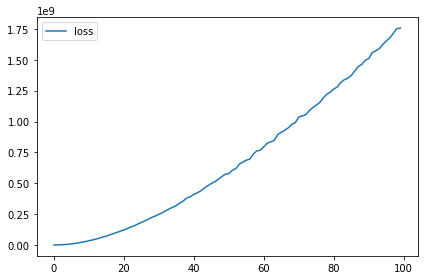

In [ ]:
history_frame = pd.DataFrame(hist.history)

history_frame.loc[:, ['loss']].plot()
history_frame.loc[:, ['binary_accuracy']].plot();

In [ ]:
test = model.predict(x = test_generator)

In [ ]:
test

(array([[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        ...,
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]], dtype=float32),
 array([[0., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 1.],
        ...,
        [0., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 1.]], dtype=float32))